
## <div style="font-size:20px;text-align:center;color:black;border-bottom:5px #0026d6 solid;padding-bottom:3%">House Pricing EDA</div>

### For a better understanding of the dataset, consider the contents of the columns

Name Data | Explain |
----------------|---------------------------------------------|
SalePrice|the property's sale price in dollars. This is the target variable that you're trying to predict.|
MSSubClass|The building class|
MSZoning|The general zoning classification|
LotFrontage|Linear feet of street connected to property|
LotArea|Lot size in square feet|
Street|Type of road access|
Alley|Type of alley access|
LotShape|General shape of property|
LandContour|Flatness of the property|
Utilities|Type of utilities available|
LotConfig|Lot configuration|
LandSlope|Slope of property|
Neighborhood|Physical locations within Ames city limits|
Condition1|Proximity to main road or railroad|
Condition2|Proximity to main road or railroad (if a second is present)|
BldgType| Type of dwelling|
HouseStyle| Style of dwelling|
OverallQual| Overall material and finish quality|
OverallCond| Overall condition rating|
YearBuilt| Original construction date|
YearRemodAdd| Remodel date|
RoofStyle| Type of roof|
RoofMatl| Roof material|
Exterior1st| Exterior covering on house|
Exterior2nd| Exterior covering on house (if more than one material)|
MasVnrType| Masonry veneer type|
MasVnrArea| Masonry veneer area in square feet|
ExterQual| Exterior material quality|
ExterCond| Present condition of the material on the exterior|
Foundation| Type of foundation|
BsmtQual| Height of the basement|
BsmtCond| General condition of the basement|
BsmtExposure| Walkout or garden level basement walls|
BsmtFinType1| Quality of basement finished area|
BsmtFinSF1| Type 1 finished square feet|
BsmtFinType2| Quality of second finished area (if present)|
BsmtFinSF2| Type 2 finished square feet|
BsmtUnfSF| Unfinished square feet of basement area|
TotalBsmtSF| Total square feet of basement area|
Heating| Type of heating|
HeatingQC| Heating quality and condition|
CentralAir| Central air conditioning|
Electrical| Electrical system|
1stFlrSF| First Floor square feet|
2ndFlrSF| Second floor square feet|
LowQualFinSF| Low quality finished square feet (all floors)|
GrLivArea| Above grade (ground) living area square feet|
BsmtFullBath| Basement full bathrooms|
BsmtHalfBath| Basement half bathrooms|
FullBath| Full bathrooms above grade|
HalfBath| Half baths above grade|
Bedroom| Number of bedrooms above basement level|
Kitchen| Number of kitchens|
KitchenQual| Kitchen quality|
TotRmsAbvGrd| Total rooms above grade (does not include bathrooms)|
Functional| Home functionality rating|
Fireplaces| Number of fireplaces|
FireplaceQu| Fireplace quality|
GarageType| Garage location|
GarageYrBlt| Year garage was built|
GarageFinish| Interior finish of the garage|
GarageCars| Size of garage in car capacity|
GarageArea| Size of garage in square feet|
GarageQual| Garage quality|
GarageCond| Garage condition|
PavedDrive| Paved driveway|
WoodDeckSF| Wood deck area in square feet|
OpenPorchSF| Open porch area in square feet|
EnclosedPorch| Enclosed porch area in square feet|
3SsnPorch| Three season porch area in square feet|
ScreenPorch| Screen porch area in square feet|
PoolArea| Pool area in square feet|
PoolQC| Pool quality|
Fence| Fence quality|
MiscFeature| Miscellaneous feature not covered in other categories|
MiscVal| $Value of miscellaneous feature|
MoSold| Month Sold|
YrSold| Year Sold|
SaleType| Type of sale|
SaleCondition| Condition of sale|

### We import the necessary libraries

In [1]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt

import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px
import plotly.offline

import missingno as msno

from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.cluster import Birch
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import NearestNeighbors
from sklearn.datasets import make_classification
from sklearn.mixture import GaussianMixture
from sklearn import metrics
from sklearn.decomposition import PCA

In [ ]:
run_locally = False
if run_locally:
    dataset_path = './house_prices.csv'
else:
    dataset_path = '../input/cyber-security-indexes/Cyber_security.csv'

### Loading data

In [2]:
# load the training and test dataset

train_df = pd.read_csv('/Users/artemnovickij/Downloads/house-prices-advanced-regression-techniques/train.csv')
test_df = pd.read_csv('/Users/artemnovickij/Downloads/house-prices-advanced-regression-techniques/test.csv')

### let's look at the first 10 rows of the training dataset

In [3]:
train_df.head(10)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
5,6,50,RL,85.0,14115,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,Shed,700,10,2009,WD,Normal,143000
6,7,20,RL,75.0,10084,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,307000
7,8,60,RL,NaN,10382,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,Shed,350,11,2009,WD,Normal,200000
8,9,50,RM,51.0,6120,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2008,WD,Abnorml,129900
9,10,190,RL,50.0,7420,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,1,2008,WD,Normal,118000


In [4]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

Now, let's check for the duplicat records

In [5]:
# check duplicated rows
train_df[train_df.duplicated()]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice


As we can see, there is no any duplicated records.

### Missing data

First, let's delete the id column because it is unnecessary

In [6]:
train_df = train_df.drop(columns=['Id'])

Alright, first of all we need detect missing values, then wee need to get rid of them for the next steps of our work. So let's list our missing values and visualize them:

In [7]:
# consider the missing values in the training dataset

total = train_df.isnull().sum().sort_values(ascending=False)
percent = ((train_df.isnull().sum() / train_df.shape[0]) * 100).sort_values(ascending=False)
null_data = pd.concat([total, percent], axis=1,join='outer', keys=['Null count', 'Percentage %'])
null_data.index.name ='Columns'
null_data = null_data[null_data['Null count'] > 0].reset_index()
null_data


,Columns,Null count,Percentage %
0,PoolQC,1453,99.520548
1,MiscFeature,1406,96.301370
2,Alley,1369,93.767123
3,Fence,1179,80.753425
4,FireplaceQu,690,47.260274
5,LotFrontage,259,17.739726
6,GarageYrBlt,81,5.547945
7,GarageCond,81,5.547945
8,GarageType,81,5.547945
9,GarageFinish,81,5.547945


In [8]:
# consider the missing values in the test dataset

total = test_df.isnull().sum().sort_values(ascending=False)
percent = ((test_df.isnull().sum() / test_df.shape[0]) * 100).sort_values(ascending=False)
null_data = pd.concat([total, percent], axis=1,join='outer', keys=['Null count', 'Percentage %'])
null_data.index.name ='Columns'
null_data = null_data[null_data['Null count'] > 0].reset_index()
null_data

,Columns,Null count,Percentage %
0,PoolQC,1456,99.794380
1,MiscFeature,1408,96.504455
2,Alley,1352,92.666210
3,Fence,1169,80.123372
4,FireplaceQu,730,50.034270
5,LotFrontage,227,15.558602
6,GarageYrBlt,78,5.346127
7,GarageQual,78,5.346127
8,GarageFinish,78,5.346127
9,GarageCond,78,5.346127


<AxesSubplot:>

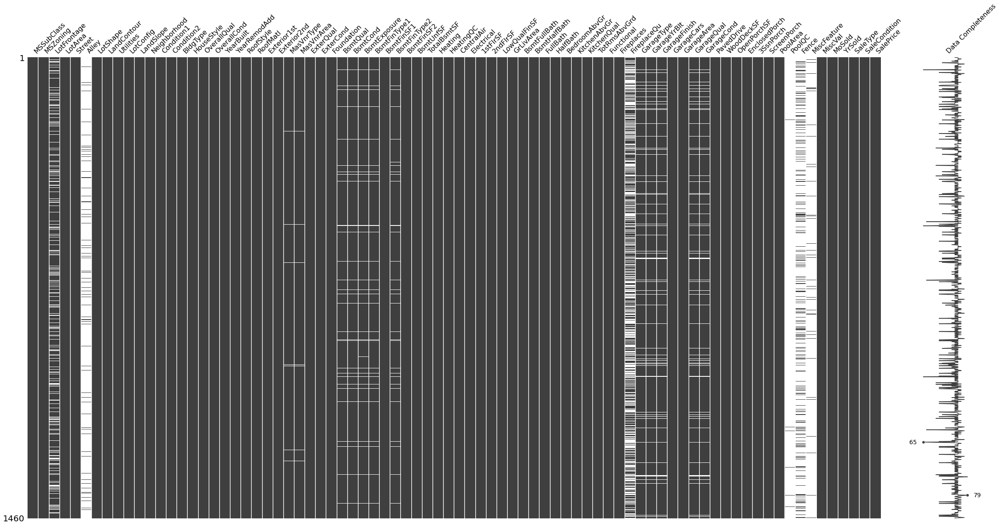

In [9]:
# visualize the missing values in the training dataset

msno.matrix(train_df, labels=True, figsize=(40, 20))


<AxesSubplot:>

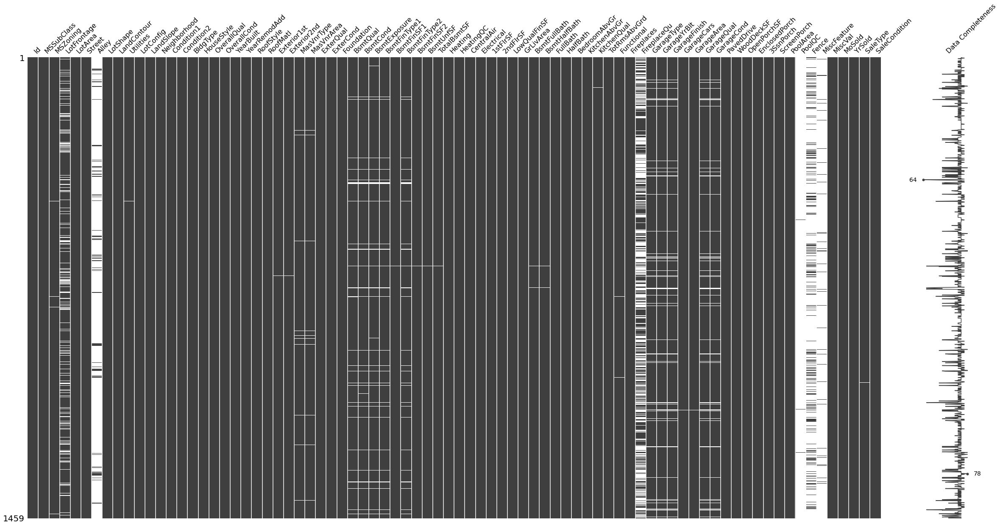

In [10]:
# visualize the missing values in the test dataset

msno.matrix(test_df, labels=True, figsize=(40, 20))


We can see that there are columns 'PoolQC','MiscFeature','Alley','Fence', which contain more than 1000 missing values and they do not contain much data, also the columns "Street", "Utilities" have the same value in all rows , so let's get rid of them.

In [11]:
# drop column in both dataset

train_df.drop(columns=['PoolQC','MiscFeature','Alley','Fence','Street', 'Utilities'],axis=1,inplace=True)
test_df.drop(columns=['PoolQC','MiscFeature','Alley','Fence', 'Street', 'Utilities'],axis=1,inplace=True)

We fill the missing values by mode value, and NaN by None

In [12]:
# Replacing NaN with None in columns
## NaN in these columns represents No Pool Quality, No Garage Type, etc. 
columns_fillnone = ['GarageType', 'GarageFinish', 'GarageQual', 'GarageCond',
                    'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2']


for col in columns_fillnone:
    train_df[col].fillna('None',inplace=True)
    test_df[col].fillna('None',inplace=True)
    

In [13]:
# fill in the missing data

list_to_fill_train = ['FireplaceQu', 'GarageYrBlt', 'MasVnrArea', 'MasVnrType', 'Electrical']
for col in list_to_fill_train:
    train_df[col] = train_df[col].fillna(train_df[col].mode()[0])
    
list_to_fill_test = ['FireplaceQu','GarageYrBlt','MasVnrType','MasVnrArea','MSZoning','BsmtHalfBath','Functional','BsmtFullBath','BsmtFinSF1','BsmtFinSF2','BsmtUnfSF','KitchenQual',
                    'TotalBsmtSF', 'Exterior2nd', 'GarageCars', 'Exterior1st', 'GarageArea', 'SaleType']
for col in list_to_fill_test:
    test_df[col] =  test_df[col].fillna(test_df[col].mode()[0])

Notice that the variable LotFrontage is of type “float”. In general, the LotFrontage of a house is more or less equal to the Neighborhood houses. 

In [14]:
# Hence we group the data by “Neighborhood” and fill the missing values with a median value of the neighborhood houses.

train_df["LotFrontage"] = train_df.groupby("Neighborhood")["LotFrontage"].transform(lambda x: x.fillna(x.median()))
test_df["LotFrontage"] = test_df.groupby("Neighborhood")["LotFrontage"].transform(lambda x: x.fillna(x.median()))

In [15]:

# let's check the missing data in the datasets

print(f'Number of missing values: {train_df.isna().sum().sum()}')
print(f'Number of missing values: {test_df.isna().sum().sum()}')

Number of missing values: 0
Number of missing values: 0


### Numeric and categorical data types

Let us examine numerical features in the train dataset

In [16]:
numeric_features = train_df.select_dtypes(include=[np.number])

numeric_features.columns

Index(['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces',
       'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'MoSold', 'YrSold', 'SalePrice'],
      dtype='object')

Let us examine categorical features in the train dataset and change it to type "category"

In [17]:
categorical_features = train_df.select_dtypes(include=['object'])

# make list categorical_data
categorical_data = list(categorical_features)

In [18]:
# make categorical data in train_df 

train_df[categorical_data] = train_df[categorical_data].astype('category',copy=False)

Now examine categorical features in the test dataset and change it to type "category"

In [19]:
categorical_features_test = test_df.select_dtypes(include=['object'])

categorical_features_test.columns

# make list categorical_data
categorical_data = list(categorical_features_test)

In [20]:
# make categorical data in test_df 

test_df[categorical_data] = test_df[categorical_data].astype('category',copy=False)

In [21]:
# перевіряємо чи дані змінились

train_df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 74 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   MSSubClass     1460 non-null   int64   
 1   MSZoning       1460 non-null   category
 2   LotFrontage    1460 non-null   float64 
 3   LotArea        1460 non-null   int64   
 4   LotShape       1460 non-null   category
 5   LandContour    1460 non-null   category
 6   LotConfig      1460 non-null   category
 7   LandSlope      1460 non-null   category
 8   Neighborhood   1460 non-null   category
 9   Condition1     1460 non-null   category
 10  Condition2     1460 non-null   category
 11  BldgType       1460 non-null   category
 12  HouseStyle     1460 non-null   category
 13  OverallQual    1460 non-null   int64   
 14  OverallCond    1460 non-null   int64   
 15  YearBuilt      1460 non-null   int64   
 16  YearRemodAdd   1460 non-null   int64   
 17  RoofStyle      1460 non-null   ca

###  Visualize the data

In [22]:
# let's see how much houses are sold for

px.box(train_df, x='SalePrice', title='Distribution of Sales Price')

Here we can see that the most buyers of houses are those worth between 100 - 200 thousand dollars, and a certain number of outliers

In [23]:
# lets see the correlation between columns and target column
corr = train_df.corr()
corr['SalePrice'].sort_values(ascending=False)[1:15].to_frame()\
.style.background_gradient(axis=1,cmap=sns.light_palette('green', as_cmap=True))


,SalePrice
OverallQual,0.790982
GrLivArea,0.708624
GarageCars,0.640409
GarageArea,0.623431
TotalBsmtSF,0.613581
1stFlrSF,0.605852
FullBath,0.560664
TotRmsAbvGrd,0.533723
YearBuilt,0.522897
YearRemodAdd,0.507101


<AxesSubplot:>

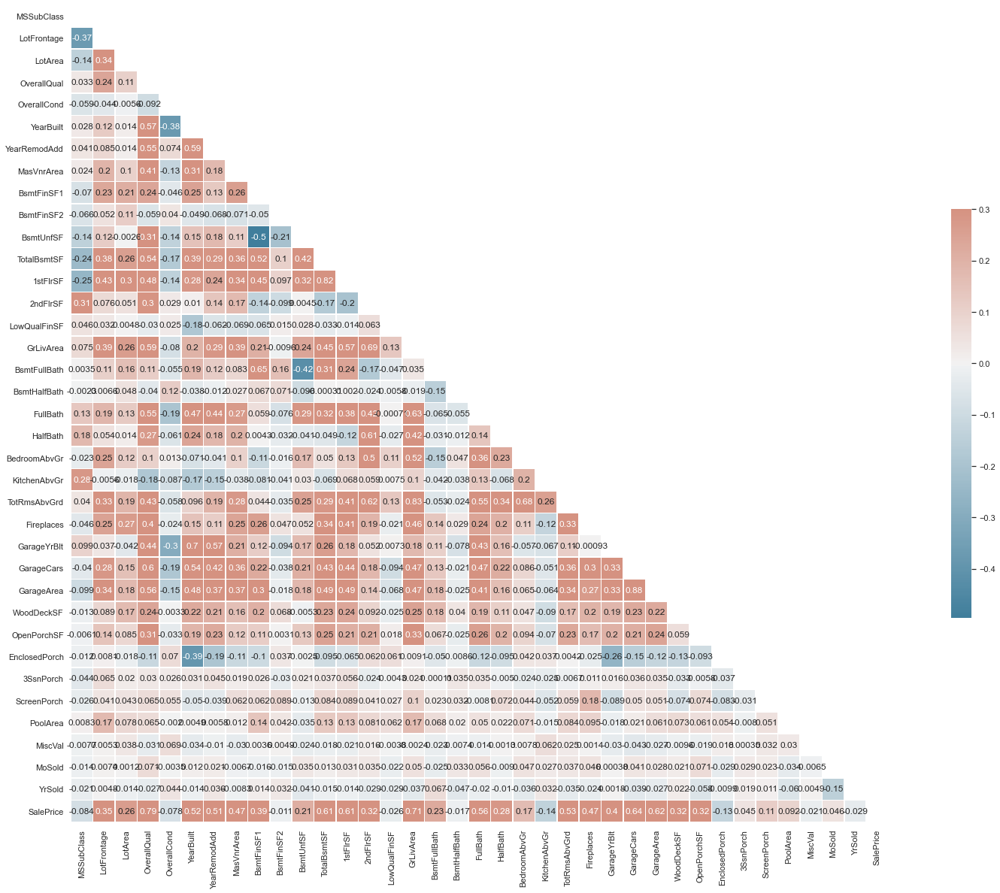

In [24]:
# create heatmap

sns.set_theme(style="white")

# make a dataframe with only numberic variables, without 'Outcome'

corr = train_df.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(30, 20))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0, annot=True,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [25]:
names_col_corr = ['OverallQual', 'GrLivArea', 'GarageCars', 'GarageArea', 'TotalBsmtSF', '1stFlrSF', 'FullBath', 'TotRmsAbvGrd', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'Fireplaces', 'GarageYrBlt','BsmtFinSF1']
fig = px.pie(train_df, values=corr['SalePrice'].sort_values(ascending=False)[1:15],names=names_col_corr, title='Correlation between columns and target column')
fig.show()

#### We will conduct a comparison study with the numeric data type

#### Let's check how the quality of materials affects

In [26]:
fig = px.box(train_df, x='OverallQual', y='SalePrice',color="OverallQual", title="Sales price vs Overall Quality")
fig.add_trace(go.Box(
    marker_color='#FF851B'
))

We see that the higher the overall quality of the materials, the higher the housing prices.

#### Let's check whether the total area of the house affects

In [27]:
# color/ size - other value

fig = px.scatter(train_df,x='GrLivArea', y='SalePrice', color='GrLivArea', size='GrLivArea', title="Sales price vs GrLivArea")
fig.show()

The larger the housing area, the more expensive the houses will be.

#### The influence of the presence of a garage and its area

In [28]:
fig = make_subplots(rows=1, cols=3, subplot_titles=('Sales price vs GarageCars',
                                                    'Sales price vs GarageArea',
                                                   'Sales price vs GarageYrBlt'))

fig.add_trace(go.Histogram(x=train_df['GarageCars'], y=train_df['SalePrice']), row=1, col=1)
fig.add_trace(go.Histogram(x=train_df['GarageArea'], y=train_df['SalePrice']),row=1, col=2)
fig.add_trace(go.Histogram(x=train_df['GarageYrBlt'], y=train_df['SalePrice']),row=1, col=3)

fig.update_layout(
    showlegend=False,
)

We see that, on average, garages are built for 1-2 cars and, accordingly, housing with them becomes more expensive and with the influence of the year when the garage was built.

#### Basement

In [29]:
fig = px.scatter(train_df,x='TotalBsmtSF', y='SalePrice', color='TotalBsmtSF',marginal_x="histogram", size='TotalBsmtSF', title="Sales price vs TotalBsmtSF")
fig.show()

The area of the basement also affects the pricing of housing

#### The size of the first floor

In [30]:
fig = px.scatter(train_df,x='1stFlrSF', y='SalePrice', color='TotalBsmtSF',marginal_x="histogram", size='1stFlrSF', title="Sales price vs 1stFlrSF")
fig.show()

We see that the larger the first floor, the more expensive the housing

#### Number of rooms without garage

In [31]:
fig = px.histogram(train_df, x='TotRmsAbvGrd', y='SalePrice',color='TotRmsAbvGrd',title="Sales price vs TotRmsAbvGrd")
fig.add_trace(go.Histogram(
    marker_color='#FF851B'
))

#### Year of Built


In [32]:
fig = px.histogram(train_df, x='YearBuilt', y='SalePrice',color='YearBuilt', title="Sales price vs YearBuilt")
fig.add_trace(go.Histogram(
    marker_color='#FF851B'
))

We see that the newer the house, the more expensive it will cost, although from 1980 to 2000 the price fell

#### We will conduct a comparison study with the category data type

In [33]:
# categorical data list
categorical_list = train_df.select_dtypes(include='category').columns.tolist()


In [34]:
# create list comprehension for titles
names=[f'SalePrice vs. {x}' for x in categorical_list]

# fix size
nr_rows = 12
nr_cols = 3

fig = make_subplots(rows=nr_rows, cols=nr_cols, subplot_titles=([name for name in names]))

# create a grid from boxplots
for r in range(0,nr_rows):
    for c in range(0,nr_cols):  
        i = r*nr_cols+c
        if i < len(categorical_list):
            fig.add_trace(go.Box(y=train_df['SalePrice'], x=train_df[categorical_list[i]]), row=r+1 , col=c+1)

# Update visual layout
fig.update_layout(
    showlegend=False,
    width=900,
    height=2500,
    autosize=False,
    margin=dict(t=15, b=0, l=5, r=5),
    template="plotly_white",
)
                                

fig.show()

For many of the categorical there is no strong relation to the Sale price.
However, for some fetaures it is easy to find a strong relation.
From the figures above these are : 'MSZoning', 'Neighborhood', 'Condition2','RoofMati','Exterior1st', 'MasVnrType', 'ExterQual', 'BsmtQual','CentralAir', 'Electrical', 'KitchenQual', 'SaleType' 

#### Let's create a plot to see how neighbors are distributed in general zoning classification 

In [35]:
# create plot sunburst
fig = px.sunburst(train_df, path=['MSZoning', 'Neighborhood'], values='SalePrice', title='Distribution of SalePrice by general zoning classification and Neighborhood')
fig.update_layout(showlegend=True,
                  width=1000,
                  height=1000,)
fig.show()


#### Let's create a plot to see the distribution of quality and types of materials

In [36]:
fig = px.treemap(
    train_df, 
    path=['ExterQual', 'Exterior1st', 'RoofMatl', 'MasVnrType'], 
    values='SalePrice', 
    color='SalePrice', 
    color_continuous_midpoint=50, 
    color_continuous_scale=px.colors.diverging.Portland,
    title = 'Type and quality exterior materials.'
    )
fig.update_layout(showlegend=True,
                  width=1050,
                  height=800,)
fig.show()

#### Let's see how interact SaleType with SalePrice

In [37]:
fig = px.violin(train_df, y='SalePrice',x='SaleType', box=True, # draw box plot inside the violin
                color='SaleType',points='all', title='Distribution of SalePrice by SaleType')
fig.update_layout(width=1000,
                  height=700,)
fig.show()


### K-Means clustering algorithm

#### Standardize our data for the algorithm

In [38]:
# used StandardScaler for do standartization our data
scaled_features = MinMaxScaler().fit_transform(numeric_features)


As we have too many features, let`s convert the original feature set into fewer artificially derived features which still maintain most of the information encompassed in the original features.

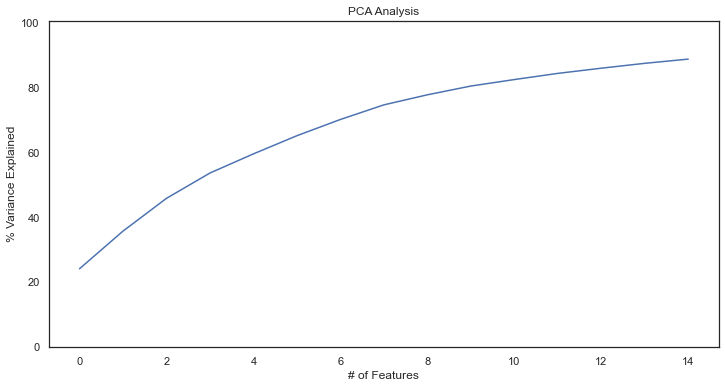

In [39]:
pca = PCA(n_components=15)
pca.fit(scaled_features)
variance = pca.explained_variance_ratio_ 
var=np.cumsum(np.round(variance, 3)*100)
plt.figure(figsize=(12,6))
plt.ylabel('% Variance Explained')
plt.xlabel('# of Features')
plt.title('PCA Analysis')
plt.ylim(0,100.5)
plt.plot(var)

It would seem that 7 principal components account for roughly 75% of the variance.

Now that we know the number of principal components needed to maintain a specific percentage of variance let’s apply a 7-component PCA to our original dataset

In [40]:
pca = PCA(n_components=7)
pca.fit(scaled_features)
pca_scale = pca.transform(scaled_features)
pca_df = pd.DataFrame(pca_scale, columns=['pc1', 'pc2', 'pc3', 'pc4', 'pc5', 'pc6', 'pc7'])
print(pca.explained_variance_ratio_)

[0.24220681 0.11561266 0.10143777 0.07841729 0.05890809 0.05638952
 0.04992098]


#### Choosing the Appropriate Number of Clusters by elbow method

In [41]:
kmeans_kwargs = {
    "init": "k-means++",
    "max_iter": 300,
    "n_init": 10
}

# A list holds the SSE values for each k
sse = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(pca_df)
    sse.append(kmeans.inertia_)

#### Let's plot a graph to see the bend of the elbow

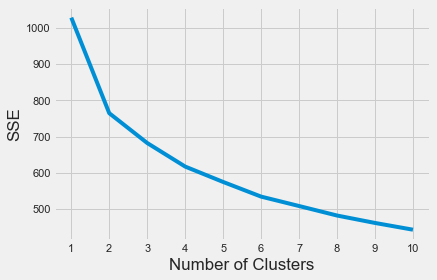

In [42]:
 plt.style.use("fivethirtyeight")
 plt.plot(range(1, 11), sse)
 plt.xticks(range(1, 11))
 plt.xlabel("Number of Clusters")
 plt.ylabel("SSE")
 plt.show()


#### Instantiate the KMeans class

In [43]:
# since elbow occured at 2, hence the optimal number of clusters for the mall data is 2
kmeans = KMeans(n_clusters = 2, init = "k-means++", max_iter = 300, n_init = 10)
kmeans.fit(pca_df)

clusters = kmeans.predict(pca_df)
centroids = kmeans.cluster_centers_

# assign calculated clusters as a new feature variable to the observations
train_df['cluster'] = clusters

train_df.groupby('cluster').mean().reset_index()

,cluster,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,0,61.137026,73.634840,11111.650146,7.100583,5.319242,1994.237609,2000.013120,156.969388,518.919825,...,127.524781,67.727405,9.106414,5.298834,14.635569,3.209913,31.676385,6.466472,2007.776968,234274.396501
1,1,53.139535,67.155039,9989.634367,5.211886,5.802326,1950.909561,1971.440568,55.387597,376.918605,...,64.748062,27.988372,33.341085,1.735142,15.437984,2.359173,53.958656,6.193798,2007.850129,133633.992248


In [44]:
kmeans_pca_scale = KMeans(n_clusters=2, n_init=100, max_iter=400, init='k-means++', random_state=42).fit(pca_df)
print('KMeans PCA Scaled Silhouette Score: {}'.format(silhouette_score(pca_df, kmeans_pca_scale.labels_, metric='euclidean')))
labels_pca_scale = kmeans_pca_scale.labels_
clusters_pca_scale = pd.concat([pca_df, pd.DataFrame({'pca_clusters':labels_pca_scale})], axis=1)

KMeans PCA Scaled Silhouette Score: 0.23194576168847988


/Users/artemnovickij/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



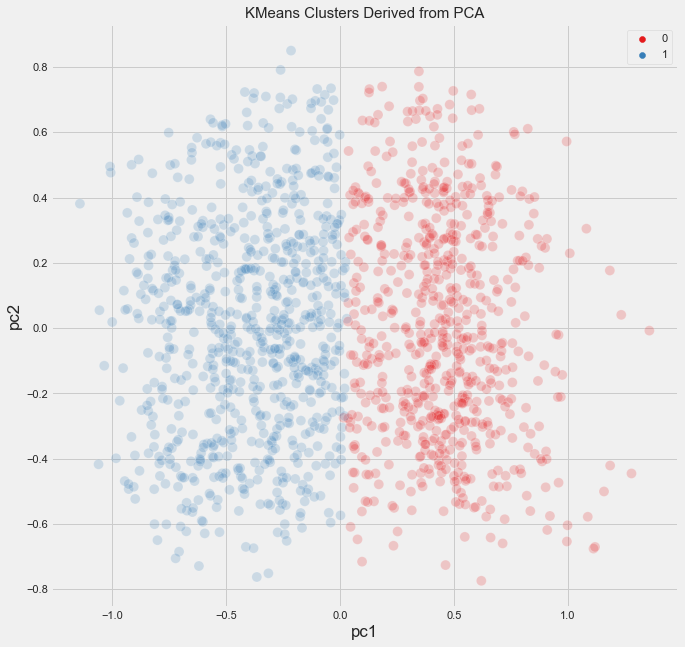

In [45]:
plt.figure(figsize = (10,10))
sns.scatterplot(clusters_pca_scale.iloc[:,0],clusters_pca_scale.iloc[:,1], hue=labels_pca_scale, palette='Set1', s=100, alpha=0.2).set_title('KMeans Clusters Derived from PCA', fontsize=15)
plt.legend()
plt.show()

In [46]:
labels = kmeans.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print(f"Estimated number of clusters: {n_clusters_}")
print(f"Estimated number of noise points: {n_noise_}")
print(f"Silhouette Coefficient: {metrics.silhouette_score(pca_df, labels)}" )

Estimated number of clusters: 2
Estimated number of noise points: 0
Silhouette Coefficient: 0.23194576168847988


### This method of cluster analysis did not give us the results we needed, we saw only 2 clusters that show us more expensive houses with a larger area built later and built with better materials and older cheaper houses with a smaller area

### DBSCAN clustering algorithm

#### Standardize our data for the algorithm

In [47]:
X = StandardScaler().fit_transform(numeric_features)

In [48]:
# determine the best value for eps , using the approach in 
# https://towardsdatascience.com/machine-learning-clustering-dbscan-determine-the-optimal-value-for-epsilon-eps-python-example-3100091cfbc
neigh = NearestNeighbors(n_neighbors=5)
nbrs = neigh.fit(X)
distances, indices = nbrs.kneighbors(X)

# next, we sort and plot the results
distances = np.sort(distances, axis=0)
distances = distances[:,1]

In [49]:
# plot distance 
fig = px.scatter(
    distances, 
    title='Distance Curve')
fig.update_xaxes(title_text='Distances')
fig.update_yaxes(title_text='Distance threashold (espsilon)')
fig.update_layout(showlegend=False)
fig.show()

The optimal value for epsilon will be eps = 8.5352

In [50]:
# ? change min_samples to 1 ?

db = DBSCAN(eps=8.5352, min_samples=2).fit(X)
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print(f"Estimated number of clusters: {n_clusters_}")
print(f"Estimated number of noise points: {n_noise_}")
print(f"Silhouette Coefficient: {metrics.silhouette_score(X, labels)}")


Estimated number of clusters: 2
Estimated number of noise points: 12
Silhouette Coefficient: 0.5557268933142371


Number of clusters: 2


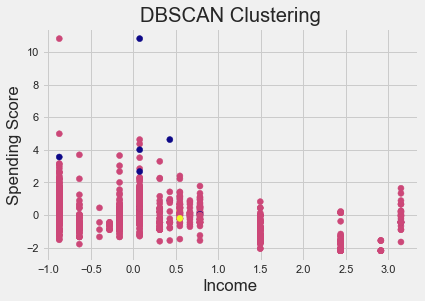

In [51]:
# Get the number of clusters (excluding noise points)
num_clusters = len(set(labels)) - (1 if -1 in labels else 0)
print("Number of clusters:", num_clusters)

# Plot the clusters
plt.scatter(X[:, 0], X[:,1], c = labels, cmap= "plasma") # plotting the clusters
plt.xlabel("Income") # X-axis label
plt.ylabel("Spending Score") # Y-axis label
plt.title('DBSCAN Clustering')
plt.show() # showing the plot

In [52]:
# next, we sort and plot the results
nn = NearestNeighbors(n_neighbors=5).fit(pca_df)
distances, idx = nn.kneighbors(pca_df)
distances = np.sort(distances, axis=0)
distances = distances[:,1]


fig = px.scatter(
    distances, 
    title='Distance Curve')
fig.update_xaxes(title_text='Distances')
fig.update_yaxes(title_text='Distance threashold (espsilon)')
fig.update_layout(showlegend=False)
fig.show()

In [53]:
db = DBSCAN(eps=0.4998, min_samples=2).fit(pca_df)
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)
print(f"Estimated number of clusters: {n_clusters_}")
print(f"Estimated number of noise points: {n_noise_}")
print(f"Silhouette Coefficient: {metrics.silhouette_score(pca_df, labels)}")


Estimated number of clusters: 5
Estimated number of noise points: 29
Silhouette Coefficient: 0.0422349248673087


Number of clusters: 5


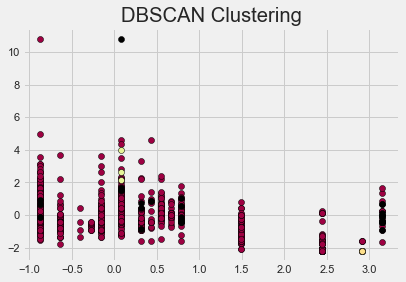

In [54]:
labels = db.labels_

# Get the number of clusters (excluding noise points)
num_clusters = len(set(labels)) - (1 if -1 in labels else 0)
print("Number of clusters:", num_clusters)

# Plot the data points with different colors for each cluster
unique_labels = set(labels)
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Noise points are plotted in black
        col = [0, 0, 0, 1]
    class_member_mask = (labels == k)
    xy = X[class_member_mask]
    plt.scatter(xy[:, 0], xy[:, 1], color=col, edgecolor='black')

plt.title('DBSCAN Clustering')
plt.show()

### HDBSCAN clustering algorithm

In [55]:
import hdbscan

min_cluster_size = 2

clusterer = hdbscan.HDBSCAN(min_cluster_size=min_cluster_size)

# Fit the model to the data
clusterer.fit(X)

# Retrieve the cluster labels
labels = clusterer.labels_

# Get the number of clusters (excluding noise points)
num_clusters = len(set(labels)) - (1 if -1 in labels else 0)

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print(f"Estimated number of clusters: {n_clusters_}")
print(f"Estimated number of noise points: {n_noise_}")
print(f"Silhouette Coefficient: {metrics.silhouette_score(pca_df, labels)}")

Estimated number of clusters: 2
Estimated number of noise points: 4
Silhouette Coefficient: 0.08282512365581277


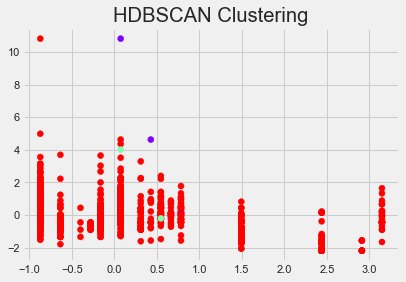

In [56]:
plt.scatter(X[:, 0], X[:, 1], c=clusterer.labels_, cmap='rainbow')
plt.title("HDBSCAN Clustering")
plt.show()

#### Gaussian Mixture Model algorithm

In [57]:
# Create a Gaussian Mixture Model object with a specified number of components/clusters
gmm = GaussianMixture(n_components=2)

# Fit the GMM to your data
gmm.fit(X)


# Get the predicted cluster labels for each data point
labels = gmm.predict(X)

# Compute the silhouette score
silhouette_avg = silhouette_score(X, labels)

print("The silhouette score is:", silhouette_avg)

The silhouette score is: 0.09887920353271012


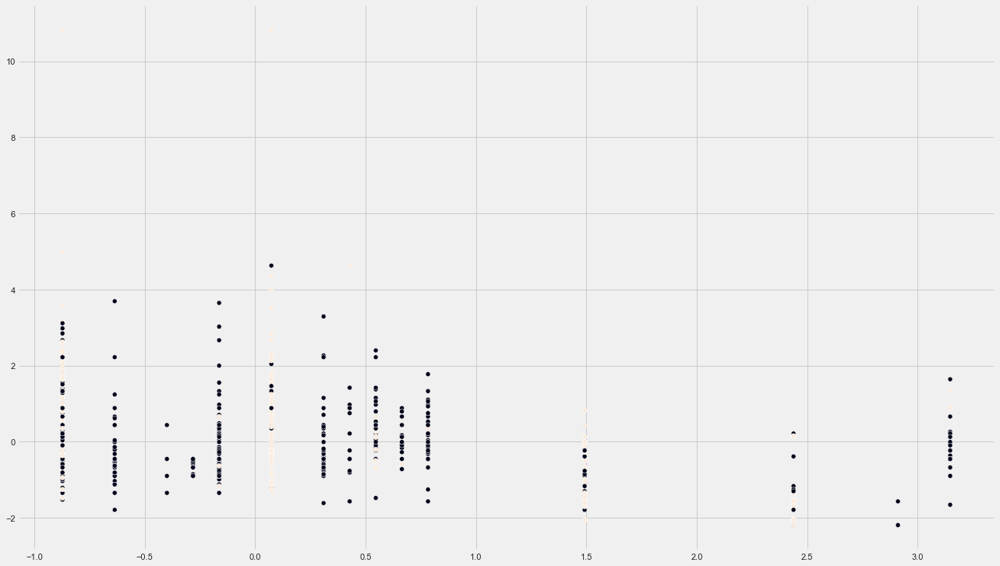

In [58]:
# plot 
plt.figure(figsize=(20,12))
sns.scatterplot(x=X[:,0], y=X[:,1],c=labels ,palette="Set2")
plt.show()

#### BIRCH algorithm

In [59]:
# Create a BIRCH object
birch = Birch(n_clusters=2)  # Specify the desired number of clusters

# Fit the BIRCH algorithm to your data
birch.fit(X)

# Get the predicted cluster labels for each data point
labels = birch.predict(X)

# Compute the silhouette score
silhouette_avg = silhouette_score(X, labels)

print("The silhouette score is:", silhouette_avg)

The silhouette score is: 0.12094827510966165


#### Agglomerative Hierarchy clustering algorithm

In [60]:
agglomerative = AgglomerativeClustering(n_clusters=2)

# Fit the Agglomerative Clustering algorithm to your data
agglomerative.fit_predict(X)

# Get the predicted cluster labels for each data point
labels = agglomerative.labels_

# Compute the silhouette score
silhouette_avg = silhouette_score(X, labels)

print("The silhouette score is:", silhouette_avg)

The silhouette score is: 0.12848731643026529


#### Let's try categorical clustering

In [61]:
from kmodes.kmodes import KModes

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 45733.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 0, cost: 45733.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 0, cost: 45733.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 0, cost: 45733.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 0, cost: 45733.0
Best run was number 1
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 655, cost: 41596.0
Run 1, iteration: 2/100, moves: 203, cost: 41368.0
Run 1, iteration: 3/100, moves: 26, cost: 41361.0
Run 1, iteration: 4/100, moves: 7, cost: 41361.0
Init: initializing centroids
Init: initializing clus

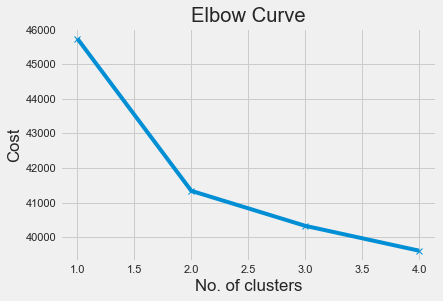

In [62]:
# Elbow curve to find optimal K
cost = []
K = range(1,5)
for k in list(K):
    kmode = KModes(n_clusters=k, init = "random", n_init = 5, verbose=1)
    kmode.fit_predict(train_df)
    cost.append(kmode.cost_)
      
plt.plot(K, cost, 'x-')
plt.xlabel('No. of clusters')
plt.ylabel('Cost')
plt.title('Elbow Curve')
plt.show()